In [4]:
import os
import math
# import torch
import datetime
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn.functional as F

from torch import nn
# from spacy.lang.en import English
from torchvision import transforms
from torchvision.models import inception_v3
from torch.utils.data import Dataset, DataLoader
import pandas as pd

import cv2

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
ds_path = '../CUB/CUB_200_2011/'
seg_path = '../CUB/segmentations/'

In [7]:
images = {'id':[], 'path_i':[], 'path_m':[]}

with open(ds_path+'images.txt', 'r') as f : 
    lines = f.readlines()
    for l in lines : 
        l = l.strip().split(' ')
        images['id'].append(int(l[0]))
        images['path_i'].append(l[1])
        images['path_m'].append(l[1][:-4]+'.png')
        
images = pd.DataFrame(images)
images.head()

,id,path_i,path_m
0,1,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross/Black_Footed_Albatr...
1,2,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross/Black_Footed_Albatr...
2,3,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross/Black_Footed_Albatr...
3,4,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross/Black_Footed_Albatr...
4,5,001.Black_footed_Albatross/Black_Footed_Albatr...,001.Black_footed_Albatross/Black_Footed_Albatr...


In [8]:
bd_boxes = {'id':[], 'x':[], 'y':[], 'width':[], 'height':[]}

with open(ds_path+'bounding_boxes.txt', 'r') as f : 
    lines = f.readlines()
    for l in lines : 
        l = l.strip().split(' ')
        bd_boxes['id'].append(float(l[0]))
        bd_boxes['x'].append(float(l[1]))
        bd_boxes['y'].append(float(l[2]))
        bd_boxes['width'].append(float(l[3]))
        bd_boxes['height'].append(float(l[4]))
        
bd_boxes = pd.DataFrame(bd_boxes)
bd_boxes['id'] = bd_boxes['id'].astype(int)
bd_boxes.head()

,id,x,y,width,height
0,1,60.0,27.0,325.0,304.0
1,2,139.0,30.0,153.0,264.0
2,3,14.0,112.0,388.0,186.0
3,4,112.0,90.0,255.0,242.0
4,5,70.0,50.0,134.0,303.0


In [9]:
part_locs = {1:{}}

with open(ds_path+'/parts/'+'part_locs.txt', 'r') as f : 
    lines = f.readlines()
    parts = {'part_id':[], 'x':[], 'y':[]}
    i = 0 
    while i<len(lines) :
        l = lines[i].strip().split(' ')
        if int(l[0]) not in part_locs : 
            part_locs[int(l[0])-1] = pd.DataFrame(parts)
            part_locs[int(l[0])] = {}
            parts = {'part_id':[], 'x':[], 'y':[]}
        # print(l)
        parts['part_id'].append(int(l[1]))
        
        parts['x'].append(float(l[2]))
        parts['y'].append(float(l[3]))
        i +=1 
    part_locs[len(part_locs)] = pd.DataFrame(parts)

In [10]:
for i in range(len(images)) : 
    p_i = images.iloc[0, 1]
    p_m = images.iloc[0, 2]
    try : 
        im = plt.imread(ds_path+'images/'+p_i)
        mask = plt.imread(seg_path+p_m)
        # print(im.shape)
    except :
        print('ImportError')
    break

In [11]:
for i in part_locs : 
    if len(part_locs[i])!=15 : 
        print('No')
        print(len(part_locs[i]), i, len(part_locs))

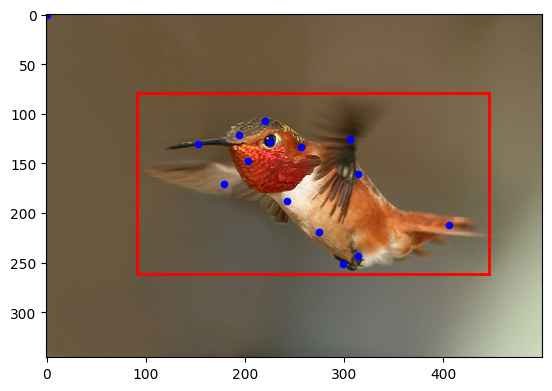

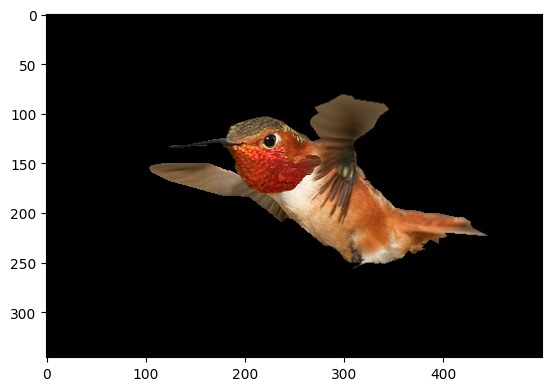

In [12]:
i = 4000

p0 = images.iloc[i, 1]
im = plt.imread(ds_path+'images/'+p0)
mask = plt.imread(seg_path+p0[:-4]+'.png')

x, y, w, h = bd_boxes.iloc[i, 1:]

parts = part_locs[i+1]

plt.imshow(im)

plt.scatter(parts['x'], parts['y'], c='b', s=20)

bbox = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
plt.gca().add_patch(bbox)
plt.show()

plt.show()
plt.imshow(im*np.transpose(np.array([mask for _ in range(3)]), (1, 2, 0)).astype(int))
plt.show()

In [18]:
class_names = {}

with open(ds_path+'classes.txt', 'r') as f : 
    lines = f.readlines()
    for line in lines : 
        line = line.strip().split(' ') 
        class_names[line[1]] = int(line[0])

class_names

{'001.Black_footed_Albatross': 1,
 '002.Laysan_Albatross': 2,
 '003.Sooty_Albatross': 3,
 '004.Groove_billed_Ani': 4,
 '005.Crested_Auklet': 5,
 '006.Least_Auklet': 6,
 '007.Parakeet_Auklet': 7,
 '008.Rhinoceros_Auklet': 8,
 '009.Brewer_Blackbird': 9,
 '010.Red_winged_Blackbird': 10,
 '011.Rusty_Blackbird': 11,
 '012.Yellow_headed_Blackbird': 12,
 '013.Bobolink': 13,
 '014.Indigo_Bunting': 14,
 '015.Lazuli_Bunting': 15,
 '016.Painted_Bunting': 16,
 '017.Cardinal': 17,
 '018.Spotted_Catbird': 18,
 '019.Gray_Catbird': 19,
 '020.Yellow_breasted_Chat': 20,
 '021.Eastern_Towhee': 21,
 '022.Chuck_will_Widow': 22,
 '023.Brandt_Cormorant': 23,
 '024.Red_faced_Cormorant': 24,
 '025.Pelagic_Cormorant': 25,
 '026.Bronzed_Cowbird': 26,
 '027.Shiny_Cowbird': 27,
 '028.Brown_Creeper': 28,
 '029.American_Crow': 29,
 '030.Fish_Crow': 30,
 '031.Black_billed_Cuckoo': 31,
 '032.Mangrove_Cuckoo': 32,
 '033.Yellow_billed_Cuckoo': 33,
 '034.Gray_crowned_Rosy_Finch': 34,
 '035.Purple_Finch': 35,
 '036.Northe

In [51]:
ds_images = []
ds_mask_images = []
ds_parts = []
ds_labels = []

for i in range(len(images)) : 
    
    pth = images.iloc[i, 1]
    class_name = pth.split('/')[0]
    
    im = plt.imread(ds_path+'images/'+pth) 
    mask = plt.imread(seg_path+pth[:-4]+'.png')
    
    # print(masked_im.shape)
    w, h = im.shape[0], im.shape[1]
    
    if len(im.shape)==3 : 
        if len(mask.shape) > 2 :
            mask = mask[:, :, 0]
        masked_im = im*np.transpose(np.array([mask for _ in range(3)]), (1, 2, 0)).astype(int)
        im = cv2.resize(im, (200, 200))
        masked_im = cv2.resize(np.array(masked_im, dtype='uint8'), (200, 200))
        ds_images.append(np.transpose(im, (2, 0, 1)))
        ds_mask_images.append(np.transpose(masked_im, (2, 0, 1)))
        parts = part_locs[i+1]
        # plt.imshow(im)
        # plt.scatter(parts['x']*200/h, parts['y']*200/w, c='b', s=20)
        # plt.show()
        P = np.array(list(parts['x']*200/h) + list(parts['y']*200/w))
        ds_parts.append(P)
        ds_labels.append(class_names[class_name])
    else : 
        ds_images.append([])
        ds_parts.append([])
        ds_mask_images.append([])
        ds_labels.append(None)

In [55]:
train_test_split = []

with open(ds_path+'train_test_split.txt', 'r') as f : 
    lines = f.readlines()
    for l in lines : 
        l = l.strip().split(' ')
        train_test_split.append(l[1])
        
train_test_split = np.array(train_test_split).astype(int)
train_test_split.shape, len(ds_parts)

((11788,), 11788)

In [101]:
class CustomDataset(Dataset):
    def __init__(self, X, y, labs, seg):
        self.X = X
        self.y = y
        self.labs = labs
        self.seg = seg
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        # Convert data and labels to PyTorch tensors
        # sample = {
        #     'data': torch.tensor(self.X[idx], dtype=torch.float),
        #     'label': torch.tensor(self.y[idx], dtype=torch.long)
        # }
        return torch.tensor(self.X[idx]/255.0, dtype=torch.float32), torch.tensor(self.y[idx], dtype=torch.float32), torch.tensor(self.labs[idx], dtype=torch.float32), torch.tensor(self.seg[idx]/255.0, dtype=torch.float32)

train_ds = ([ds_images[i] for i in range(len(ds_images)) if len(ds_images[i]) and train_test_split[i]], [ds_parts[i]/200 for i in range(len(ds_parts)) if len(ds_parts[i]) and train_test_split[i]], [ds_labels[i] for i in range(len(ds_parts)) if len(ds_parts[i]) and train_test_split[i]], [ds_mask_images[i] for i in range(len(ds_images)) if len(ds_images[i]) and train_test_split[i]])
test_ds = ([ds_images[i] for i in range(len(ds_images)) if len(ds_images[i]) and train_test_split[i]==0], [ds_parts[i]/200 for i in range(len(ds_parts)) if len(ds_parts[i]) and train_test_split[i]==0], [ds_labels[i] for i in range(len(ds_parts)) if len(ds_parts[i]) and train_test_split[i]==0], [ds_mask_images[i] for i in range(len(ds_images)) if len(ds_images[i]) and train_test_split[i]==0])

In [50]:
len(train_ds[2]), len(train_ds[1])

(5990, 5990)

In [57]:
for i in train_ds[2] : 
    if i==None : 
        print(i)

In [102]:
train_ds_c = CustomDataset(train_ds[0], train_ds[1], train_ds[2], train_ds[3])
test_ds_c = CustomDataset(test_ds[0], test_ds[1], test_ds[2], test_ds[3])

batch_size = 32
shuffle = True

train_data_loader = DataLoader(train_ds_c, batch_size=batch_size, shuffle=shuffle)
test_data_loader = DataLoader(test_ds_c, batch_size=batch_size, shuffle=shuffle)

In [105]:
for (data, labels, c, seg) in train_data_loader : 
    print(data.shape, labels.shape, c.shape, seg.shape, labels.min(), labels.max())
    break

torch.Size([32, 3, 200, 200]) torch.Size([32, 30]) torch.Size([32]) torch.Size([32, 3, 200, 200]) tensor(0.) tensor(0.8693)


In [15]:
def save_log(text, file) : 

    # Open the file in append mode
    with open(file, 'a') as file:
        # Add new lines of text
        for line in text : 
            file.write(line+"\n")

save_log(['accuracy : 90%'], 'log.txt')

In [43]:
from tqdm import tqdm
from IPython.display import clear_output
device = 'cpu'

def train(model, train_loader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        b_i = 0
        for inputs, labels, _ in train_loader:
            print(f'Batch {b_i}/188')
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            optimizer.zero_grad()
            
            outputs = model(inputs)
            # print(outputs.detach().min(), outputs.detach().max())
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            b_i += 1
            clear_output()
        
        epoch_loss = running_loss / len(train_loader.dataset)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")
        save_log([f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}"], 'log.txt')

def evaluate(model, test_loader, criterion):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            total_loss += loss.item() * inputs.size(0)
    
    avg_loss = total_loss / len(test_loader.dataset)
    print(f"Average Test Loss: {avg_loss:.4f}")
    save_log([f"Average Test Loss: {avg_loss:.4f}"], 'log.txt')

In [17]:
# import torchvision.models as models
# import torch.optim as optim
# from efficientnet_pytorch import EfficientNet

# # Load the pre-trained ResNet50 model
# resnet = models.resnet50(pretrained=True)
# # resnet = models.mobilenet_v2(pretrained=True)
# # resnet = models.inception_v3(pretrained=True)
# # resnet = EfficientNet.from_pretrained('efficientnet-b0')

# # Freeze all the parameters in the pre-trained ResNet
# for param in resnet.parameters():
#     param.requires_grad = False
    
# for param in resnet.layer4[2].parameters() : 
#     param.requires_grad = True

# # Modify the final fully connected layer to match the output size for regression
# # num_ftrs = resnet._fc.in_features
# # resnet.fc = nn.Linear(num_ftrs, 30)  # Output size 1 for regression (assuming one output) 

# # resnet._fc = nn.Sequential(
# #     nn.Linear(num_ftrs, 30),
# #     nn.Sigmoid()  # Apply sigmoid activation
# # )

# num_ftrs = resnet.fc.in_features

# resnet.fc = nn.Sequential(
#     nn.Linear(num_ftrs, 500),
#     nn.ReLU(), 
#     nn.Linear(500, 30),
#     nn.Sigmoid()  # Apply sigmoid activation
# )

# # resnet.sigmoid = nn.Sigmoid()

# # Define loss function and optimizer
# criterion = nn.MSELoss()
# optimizer = optim.Adam(resnet.parameters(), lr=0.001)

# resnet.to(device)

# print(num_ftrs)

In [18]:
# # Train the model
# train(resnet, train_data_loader, criterion, optimizer)

# # Evaluate the model
# evaluate(resnet, test_data_loader, criterion)

In [83]:
import torchvision.models as models
import torch.optim as optim
from efficientnet_pytorch import EfficientNet

resnet = models.resnet50() # we do not specify ``weights``, i.e. create untrained model
num_ftrs = resnet.fc.in_features

resnet.fc = nn.Sequential(
    nn.Linear(num_ftrs, 500),
    nn.ReLU(), 
    nn.Linear(500, 30),
    nn.Sigmoid()  # Apply sigmoid activation
)
resnet.load_state_dict(torch.load('../models/finetuned_resnet.pth'))
resnet.fc.parameters()

criterion = nn.MSELoss()
optimizer = optim.Adam(resnet.parameters(), lr=0.001)

In [ ]:
# Evaluate the model
evaluate(resnet, test_data_loader, criterion)

In [84]:
from time import time

resnet.eval()
total_loss = 0.0

with torch.no_grad():
    s = time()
    for inputs, labels in test_data_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)
        print(time()-s)
        s = time()
        
        outputs = resnet(inputs)
        print(time()-s)
        s = time()
        loss = criterion(outputs, labels)
        total_loss += loss.item() * inputs.size(0)
        print(time()-s)
        break

# avg_loss = total_loss / len(test_data_loader.dataset)
# print(f"Average Test Loss: {avg_loss:.4f}")

0.12765789031982422
4.02127742767334
0.0009965896606445312


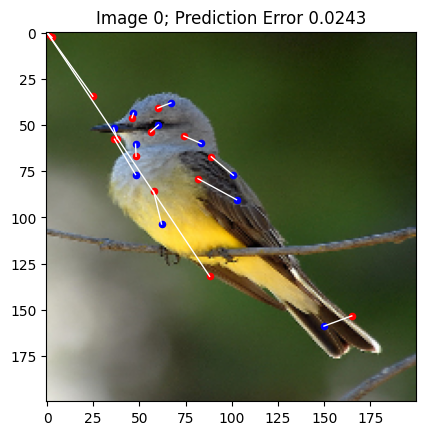

In [85]:

for i in range(32) : 
    # i = 18 
    r, p = labels.numpy()[i], outputs.numpy()[i]

    plt.imshow(np.transpose(inputs.numpy()[i], (1, 2, 0)))

    plt.scatter(r[:15]*200, r[15:]*200, c='b', s=20)
    plt.scatter(p[:15]*200, p[15:]*200, c='r', s=20)
    
    error = np.sum((r-p)**2)/30

    for k in range(15) : 
        plt.plot([r[k]*200, p[k]*200], [r[k+15]*200, p[k+15]*200], c='w', linewidth=1)
        
    plt.title(f'Image {str(i)}; Prediction Error {round(error, 4)}')

    plt.show()
    break

In [63]:
resnet.eval()
total_loss = 0.0
idx = -1 
min_error = 1000 
min_image = []
min_out = []
e = []

with torch.no_grad():
    for inputs, labels in test_data_loader:
        inputs = inputs.to(device)
        labels = labels.to(device).numpy()
        outputs = resnet(inputs).numpy()
        errors = np.mean((outputs - labels)**2, axis=1)
        
        idx = np.argmin(errors) 
        min_error = np.min(errors)
        min_image.append(inputs[idx].numpy())
        min_out.append(outputs[idx])
        e.append(min_error)
        print(f'Min errors found : {min_error}')

Min errors found : 0.0010956235928460956
Min errors found : 0.001140126958489418
Min errors found : 0.0009302429389208555
Min errors found : 0.001498789875768125
Min errors found : 0.001145925372838974
Min errors found : 0.0014816231559962034
Min errors found : 0.0007628534804098308
Min errors found : 0.0007941530784592032
Min errors found : 0.0019930812995880842
Min errors found : 0.001310077146627009
Min errors found : 0.002155157271772623
Min errors found : 0.0014187055639922619
Min errors found : 0.002381844213232398
Min errors found : 0.0011418276699259877
Min errors found : 0.0024276196490973234
Min errors found : 0.0013643450802192092
Min errors found : 0.000747519196011126
Min errors found : 0.000981717836111784
Min errors found : 0.0022174350451678038
Min errors found : 0.00060309749096632
Min errors found : 0.0013347921194508672
Min errors found : 0.0013732545776292682
Min errors found : 0.0015026257606223226
Min errors found : 0.001098526525311172
Min errors found : 0.001905

In [80]:
parts_names = {}

with open(ds_path+'parts/parts.txt') as f : 
    lines = f.readlines()
    for line in lines : 
        id, name = line.strip().split(' ')
        parts_names[int(id)] = name

In [81]:
parts_names

{1: 'back',
 2: 'beak',
 3: 'belly',
 4: 'breast',
 5: 'crown',
 6: 'forehead',
 7: 'left_eye',
 8: 'left_leg',
 9: 'left_wing',
 10: 'nape',
 11: 'right_eye',
 12: 'right_leg',
 13: 'right_wing',
 14: 'tail',
 15: 'throat'}

In [66]:
A = np.argsort(e)

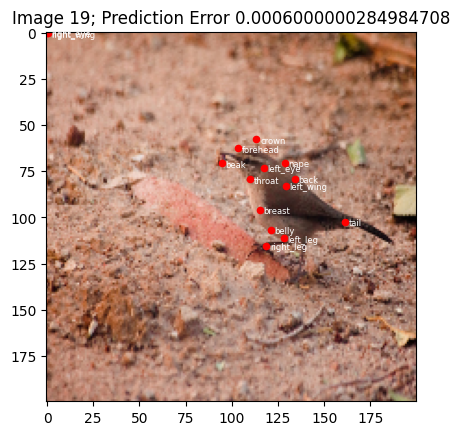

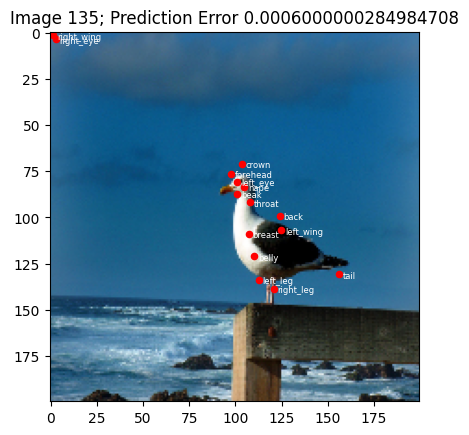

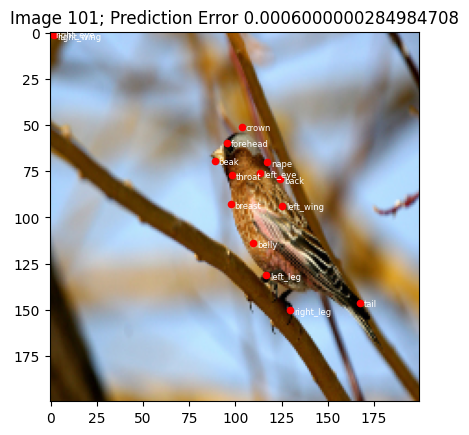

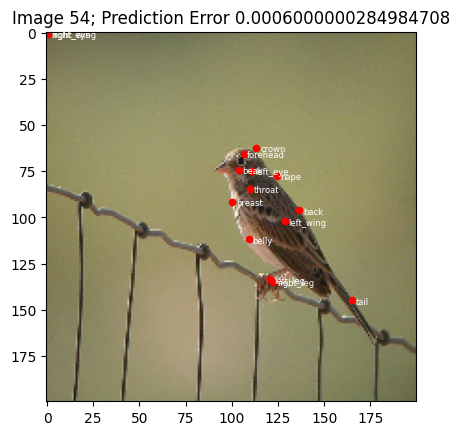

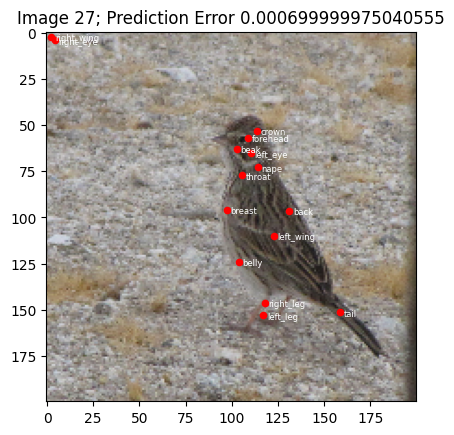

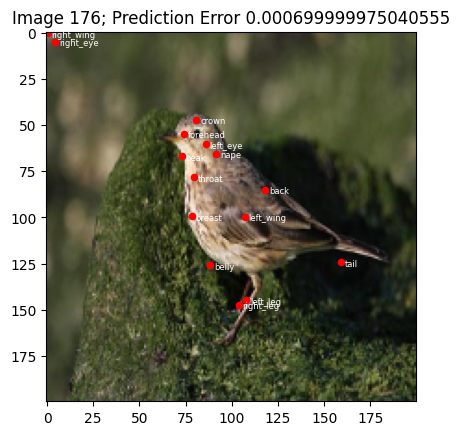

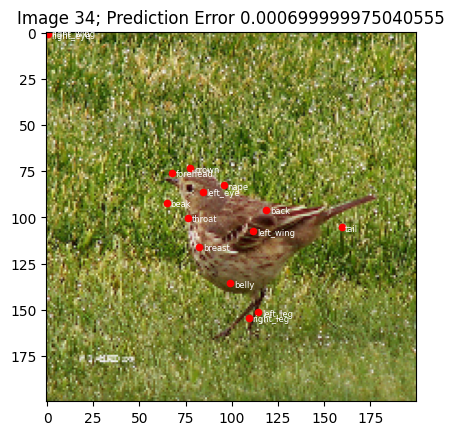

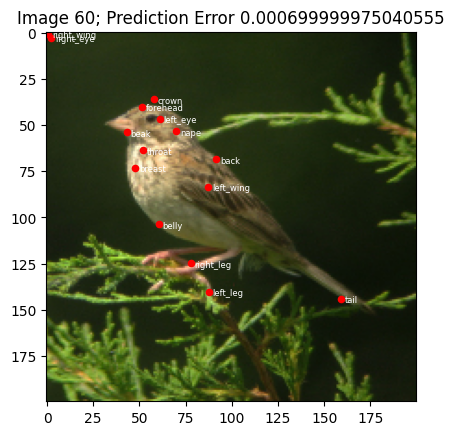

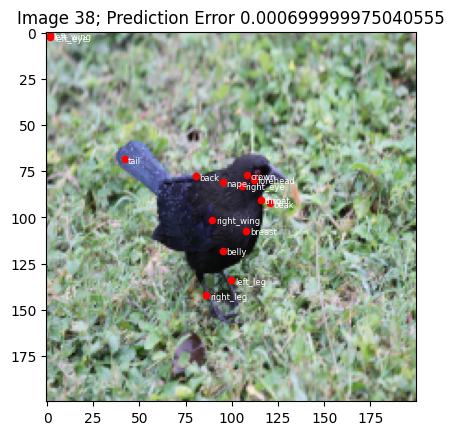

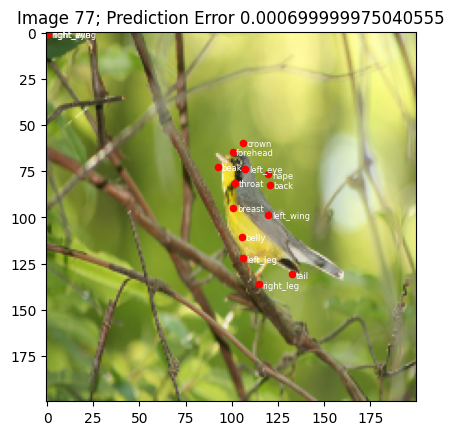

In [69]:
for j in A[:10] : 
    
    p = min_out[j]

    plt.imshow(np.transpose(min_image[j], (1, 2, 0)))

    # plt.scatter(r[:15]*200, r[15:]*200, c='b', s=20)
    plt.scatter(p[:15]*200, p[15:]*200, c='r', s=20)

    for i in range(15) : 
        plt.text(p[i]*200+2, p[i+15]*200+2, parts_names[i+1], fontsize=6, c='w')

    error = round(e[j], 4)

    # for k in range(15) : 
    #     plt.plot([r[k]*200, p[k]*200], [r[k+15]*200, p[k+15]*200], c='w', linewidth=1)
        
    plt.title(f'Image {str(j)}; Prediction Error {error}')
    plt.savefig('../images/output.png')
    plt.show()

In [28]:
class GradCamModel(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.gradients = None
        self.tensorhook = []
        self.layerhook = []
        self.selected_out = None
        
        #PRETRAINED MODEL
        # self.pretrained = models.resnet50(pretrained=True) 
        self.pretrained = model
        self.layerhook.append(self.pretrained.layer4.register_forward_hook(self.forward_hook()))
        
        for p in self.pretrained.parameters():
            p.requires_grad = True
    
    def activations_hook(self,grad):
        self.gradients = grad

    def get_act_grads(self):
        return self.gradients

    def forward_hook(self):
        def hook(module, inp, out):
            self.selected_out = out
            self.tensorhook.append(out.register_hook(self.activations_hook))
        return hook

    def forward(self,x):
        out = self.pretrained(x)
        return out, self.selected_out

In [ ]:
for idx in range(15) : 
    
    gcmodel = GradCamModel(resnet).to('cpu')
    out, acts = gcmodel(inputs)
    acts = acts.detach().cpu()
    grad_labels = np.zeros((32, 30)) 
    grad_labels[:, [idx, idx+15]] = 1 #labels.numpy()[:, [idx, idx+15]]

    grad_labels = torch.tensor(grad_labels, dtype=torch.float32)
    loss = nn.CrossEntropyLoss()(out, grad_labels.to('cpu'))
    loss.backward()

    grads = gcmodel.get_act_grads().detach().cpu()

    pooled_grads = torch.mean(grads, dim=[0,2,3]).detach().cpu()

    for i in range(acts.shape[1]):
        acts[:,i,:,:] *= pooled_grads[i]
    heatmap_j = torch.mean(acts, dim = 1).squeeze()
    heatmap_j_max = heatmap_j.max(axis = 0)[0]
    heatmap_j /= heatmap_j_max
    h_map = cv2.resize(heatmap_j[6].numpy(),(200,200))

    cmap = plt.cm.get_cmap('jet',256)
    heatmap_j2 = cmap(h_map,alpha = 0.4)
    plt.imshow(np.transpose(inputs.numpy()[6], (1, 2, 0)))
    plt.imshow(heatmap_j2)
    plt.title(idx)
    plt.show()

<h2>NEXT</h2>

Preprocessing : 

- Resize all images to a fixed shape
- Format accordingly the bouding boxed coordinates & part coords & segmentation masks 
- Write a data loader from folder class with the appropriate labels for ASL (if ds too large)

Processing (ideas) : 

- Use ASL to fine tune the model ==> Parts locations regression [15*2 variable to predict] 
- Implement the same architechture in the paper + (a similarity loss of similarity between the semantic embedding of the image with and without backgrounds)
- Let's see


Used knoweledge checklist : 

- Images (check) : ASL & SE
- parts (check) : ASL 
- segmentation (check) : SE 
- atrribitues (check) : SE 

In [322]:
# attributes_file = []

# n = 0
# with open(ds_path+'attributes/image_attribute_labels_clean.txt', 'r') as f : 
#     lines = f.readlines()
#     for line in lines : 
#         try : 
#             line = np.array(line.strip().split(' ')).astype(float)
#             attributes_file.append(line)
#         except : 
#             n+=1 
#             attributes_file.append([])
        
# attributes_file = np.array(attributes_file)
n

0

In [323]:
attributes_file.shape

(3677856, 5)

In [321]:
ds_labels = []
with open(ds_path+'image_class_labels.txt', 'r') as f : 
    lines = f.readlines()
    for line in lines : 
        line = line.strip().split(' ')
        ds_labels.append(int(line[1]))
        
ds_labels = np.array(ds_labels)

2
has_bill_shape::needle 0.58041958042
has_wing_color::rufous 0.744966442953
has_wing_color::black 0.44966442952999996
has_upperparts_color::rufous 0.905405405405
has_upperparts_color::orange 0.5202702702700001
has_upperparts_color::black 0.452702702703
has_underparts_color::rufous 0.8709677419349999
has_underparts_color::buff 0.876623376623
has_back_color::rufous 0.887218045113
has_tail_shape::fan-shaped_tail 0.490196078431
has_upper_tail_color::rufous 0.5948275862069999
has_upper_tail_color::orange 0.525862068966
has_head_pattern::eyering 0.567375886525
has_breast_color::rufous 0.79375
has_throat_color::rufous 0.519480519481
has_throat_color::black 0.714285714286
has_eye_color::orange 0.9795918367349999
has_eye_color::buff 0.783783783784
has_forehead_color::rufous 0.41772151898700005
has_forehead_color::black 0.708860759494
has_under_tail_color::rufous 0.43697478991600003
has_under_tail_color::orange 0.705882352941
has_under_tail_color::black 0.445378151261
has_nape_color::rufous 0.6

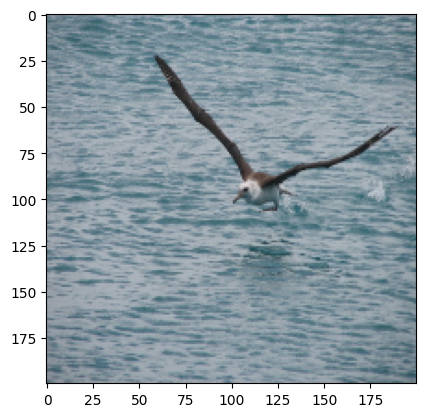

In [340]:
# attributes = []
# for i in range(len(ds_images)) : 
#     i = 1000
#     slice = attributes_file[312*i:312*(i+1), 2:4]
#     vector = 0.5 + (2*slice[:, 0]-1)*slice[:, 1]/8
#     attributes.append(vector)
#     vec = slice[:, 0]
    
#     ext_attributes = np.where(vec>0.5)[0]
#     L = []
#     for idx in ext_attributes : 
#         L.append(attributes_names[idx])
        
#     print(L)

#     plt.imshow(np.transpose(ds_images[i], (1, 2, 0)))
#     plt.show()

#     break
    
# attributes = np.array(attributes)


attributes = [] 

with open(ds_path+'attributes/class_attribute_labels_continuous.txt', 'r') as f : 
    lines = f.readlines()
    for i in range(len(lines)) :
        i = 60
        print(ds_labels[i])
        line = np.array(lines[i].strip().split(' ')).astype(float)/100
        ext_attributes = np.where(line>0.4)[0]
        L = []
        for idx in ext_attributes : 
            print(attributes_names[idx], line[idx])
            
        plt.imshow(np.transpose(ds_images[i], (1, 2, 0)))
        plt.show()
        break
        

['has_bill_shape::needle', 'has_head_pattern::crested', 'has_throat_color::red', 'has_eye_color::blue', 'has_bill_length::about_the_same_as_head', 'has_forehead_color::black', 'has_nape_color::red', 'has_wing_shape::long-wings', 'has_shape::chicken-like-marsh', 'has_primary_color::red', 'has_bill_color::red', 'has_crown_color::red']


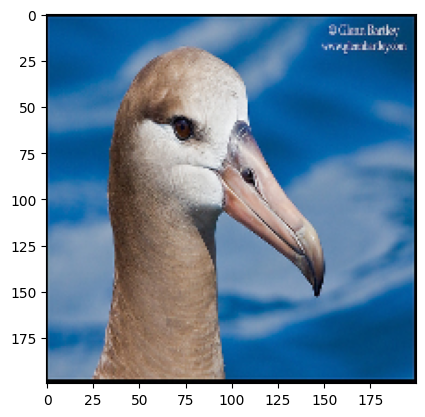

In [303]:
i = 0

ext_attributes = np.where(attributes[i]>0.5)[0]
L = []
for idx in ext_attributes : 
    L.append(attributes_names[idx])
    
print(L)

plt.imshow(np.transpose(ds_images[i], (1, 2, 0)))
plt.show()

In [233]:
train_ds_sem = ([ds_images[i] for i in range(len(ds_images)) if len(ds_images[i]) and train_test_split[i]], [attributes[i] for i in range(len(attributes)) if len(ds_images[i]) and train_test_split[i]], [ds_labels[i] for i in range(len(ds_labels)) if len(ds_images[i]) and train_test_split[i]], [ds_mask_images[i] for i in range(len(ds_mask_images)) if len(ds_mask_images[i]) and train_test_split[i]], [ds_parts[i]/200 for i in range(len(ds_parts)) if len(ds_parts[i]) and train_test_split[i]])
test_ds_sem = ([ds_images[i] for i in range(len(ds_images)) if len(ds_images[i]) and train_test_split[i]==0], [attributes[i] for i in range(len(attributes)) if len(ds_images[i]) and train_test_split[i]==0], [ds_labels[i] for i in range(len(ds_labels)) if len(ds_images[i]) and train_test_split[i]==0], [ds_mask_images[i] for i in range(len(ds_mask_images)) if len(ds_mask_images[i]) and train_test_split[i]==0], [ds_parts[i]/200 for i in range(len(ds_parts)) if len(ds_parts[i]) and train_test_split[i]==0])

In [234]:
class CustomDataset(Dataset):
    def __init__(self, X, y, lab, seg, parts):
        self.X = X
        self.y = y
        self.lab = lab
        self.seg = seg
        self.parts = parts
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        # Convert data and labels to PyTorch tensors
        # sample = {
        #     'data': torch.tensor(self.X[idx], dtype=torch.float),
        #     'label': torch.tensor(self.y[idx], dtype=torch.long)
        # }
        return torch.tensor(self.X[idx]/255.0, dtype=torch.float32), torch.tensor(self.y[idx], dtype=torch.float32), torch.tensor(self.lab[idx], dtype=torch.float32), torch.tensor(self.seg[idx]/255.0, dtype=torch.float32), torch.tensor(self.parts[idx], dtype=torch.float32)

In [193]:
len(train_ds_sem[0]), len(train_ds_sem[1]), len(train_ds_sem[2]), len(train_ds_sem[3]), len(test_ds_sem[0]), len(test_ds_sem[1]), len(test_ds_sem[2]), len(test_ds_sem[3])

(5990, 5990, 5990, 5990, 5790, 5790, 5790, 5790)

In [235]:
train_ds_semc = CustomDataset(train_ds_sem[0], train_ds_sem[1], train_ds_sem[2], train_ds_sem[3], train_ds_sem[4])
test_ds_semc = CustomDataset(test_ds_sem[0], test_ds_sem[1], test_ds_sem[2], test_ds_sem[3], test_ds_sem[4])

batch_size = 32
shuffle = True

train_data_loader_sem = DataLoader(train_ds_semc, batch_size=batch_size, shuffle=shuffle)
test_data_loader_sem = DataLoader(test_ds_semc, batch_size=batch_size, shuffle=shuffle)

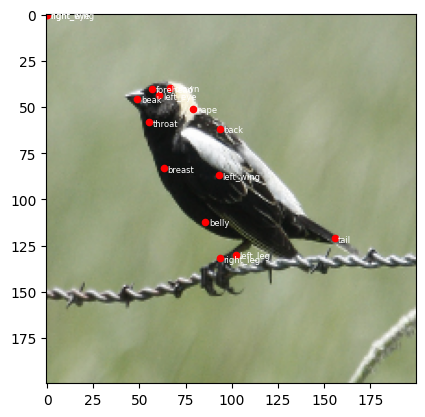

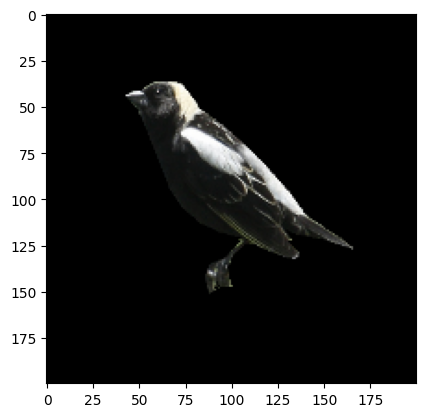

tensor(13.)


In [245]:
for (data, labels, class_lab, seg_data, parts_lab) in train_data_loader_sem : 
    i = 0
    plt.imshow(np.transpose(data[i].numpy(), (1, 2, 0)))
    p = parts_lab[i].numpy()
    # plt.scatter(r[:15]*200, r[15:]*200, c='b', s=20)
    plt.scatter(p[:15]*200, p[15:]*200, c='r', s=20)

    for k in range(15) : 
        plt.text(p[k]*200+2, p[k+15]*200+2, parts_names[k+1], fontsize=6, c='w')
    plt.show()
    plt.imshow(np.transpose(seg_data[i].numpy(), (1, 2, 0)))
    plt.show()
    # print(labels[i].numpy())
    print(class_lab[i])
    break 

In [246]:
class SemanticAutoEncoder(nn.Module):
    def __init__(self, latent_dim1, latent_dim2, num_ftrs) :
        super(SemanticAutoEncoder, self).__init__()
        
        # Pretrained (fine-tuned) Resnet modul 
        self.conv1, self.bn1, self.relu, self.maxpool = resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool
        self.layer1 = resnet.layer1 
        self.layer2 = resnet.layer2 
        self.layer3 = resnet.layer3 
        self.layer4 = resnet.layer4 
        self.avgpool = resnet.avgpool
        
        # Semantic encoder 
        self.sem_enc = nn.Sequential(
            nn.Linear(num_ftrs, num_ftrs//2),
            nn.ReLU(), 
            # nn.Linear(num_ftrs//2, num_ftrs//4),
            # nn.ReLU(), 
            nn.Linear(num_ftrs//2, latent_dim1),
            nn.Sigmoid()
        )
        
        # Residual encoder 
        self.res_enc = nn.Sequential(
            nn.Linear(num_ftrs, num_ftrs//2),
            nn.ReLU(), 
            # nn.Linear(num_ftrs//2, num_ftrs//4),
            # nn.ReLU(), 
            nn.Linear(num_ftrs//2, latent_dim2),
            nn.Sigmoid()
        )
        
        # Decoder 
        self.dec = nn.Sequential(
            nn.Linear(latent_dim1+latent_dim2, num_ftrs//4),
            nn.ReLU(), 
            nn.Linear(num_ftrs//4, num_ftrs//2),
            nn.ReLU(), 
            nn.Linear(num_ftrs//2, num_ftrs),
            nn.ReLU()
        )
        
        # Parts regressor 
        self.reg = nn.Sequential(
            nn.Linear(num_ftrs, 500),
            nn.ReLU(), 
            nn.Linear(500, 30),
            nn.Sigmoid()  # Apply sigmoid activation
        )
        
    def encoder_resnet(self, x):
        x = self.maxpool(self.relu(self.bn1(self.conv1(x))))  # Resnet Top layers 
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.avgpool(self.layer4(x))
        batch, _, _, _ = x.shape
        x = x.reshape(batch, -1)
        # print(x.shape)
        return x
    
    def sem_encoder(self, x) : 
        x = self.sem_enc(x)
        # print(x.shape)
        return x
    
    def res_encoder(self, x) : 
        x = self.res_enc(x)
        # print(x.shape)
        return x
    
    def decoder(self, z1, z2) : 
        z = torch.cat((z1, z2), 1)
        z = self.dec(z) 
        # print(z.shape)
        return z
    
    def forward(self, x) : 
        feature_map = self.encoder_resnet(x)
        z1, z2 = self.sem_encoder(feature_map), self.res_encoder(feature_map) 
        reconst_map = self.decoder(z1, z2) 
        parts_out = self.reg(feature_map)
        return feature_map, z1, z2, reconst_map, parts_out

In [274]:
SAE = SemanticAutoEncoder(312, 50, 2048)
list_of_layers_to_finetune = ['dec', 'sem_enc', 'res_enc', 'layer4.2', 'layer4.1', 'reg']
params_to_update = []

for name,param in SAE.named_parameters():
    update = False
    for layer in list_of_layers_to_finetune : 
        if layer in name : 
            update = True
            break
    if update : 
        param.requires_grad = True 
        params_to_update.append(param)
        print(name)
    else : 
        param.requires_grad = False
        

layer4.1.conv1.weight
layer4.1.bn1.weight
layer4.1.bn1.bias
layer4.1.conv2.weight
layer4.1.bn2.weight
layer4.1.bn2.bias
layer4.1.conv3.weight
layer4.1.bn3.weight
layer4.1.bn3.bias
layer4.2.conv1.weight
layer4.2.bn1.weight
layer4.2.bn1.bias
layer4.2.conv2.weight
layer4.2.bn2.weight
layer4.2.bn2.bias
layer4.2.conv3.weight
layer4.2.bn3.weight
layer4.2.bn3.bias
sem_enc.0.weight
sem_enc.0.bias
sem_enc.2.weight
sem_enc.2.bias
res_enc.0.weight
res_enc.0.bias
res_enc.2.weight
res_enc.2.bias
dec.0.weight
dec.0.bias
dec.2.weight
dec.2.bias
dec.4.weight
dec.4.bias
reg.0.weight
reg.0.bias
reg.2.weight
reg.2.bias


In [275]:


optimizer = optim.Adam(params_to_update)  # TODO : freeze the ResNet params

def loss_function(attributes_labels, map, z1, z2, reconst_map, parts_out, parts_lab, history=None):

    MSE = F.mse_loss(reconst_map, map)
    BCE = F.mse_loss(z1, attributes_labels)
    # SIM = F.mse_loss(z1, seg_z1)
    MSE_p = F.mse_loss(parts_out, parts_lab)
    if history : 
        history['mse'].append(MSE)
        history['bce'].append(BCE)
    
    # print(MSE, BCE, SIM) 
    return MSE + BCE + MSE_p

In [276]:
def train(epoch, history):
    SAE.train()
    train_loss = 0
    for batch_idx, (data, labels, _, _, parts_lab) in enumerate(train_data_loader_sem):
        # print(data.shape)
        optimizer.zero_grad()
        
        feature_map, z1, z2, reconst_map, parts_out = SAE(data)
        # _, seg_z1, _, _ = SAE(seg_data)
    
        loss = loss_function(labels, feature_map, z1, z2, reconst_map, parts_out, parts_lab, history)
        
        loss.backward()
        train_loss += loss.item()
        optimizer.step()
        
        if batch_idx % 10 == 0:
            text = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(epoch, batch_idx * len(data), len(train_data_loader_sem.dataset),10. * batch_idx / len(train_data_loader_sem), loss.item() / len(data))
            print(text)
            save_log([text], 'log_sae.txt')
    print('====> Epoch: {} Average loss: {:.4f}'.format(epoch, train_loss / len(train_data_loader_sem.dataset)))


In [277]:
def test():
    SAE.eval()
    test_loss= 0
    with torch.no_grad():
        for data, labels, _, _, parts_lab in test_data_loader_sem:

            feature_map, z1, z2, reconst_map, parts_out = SAE(data)
            # _, seg_z1, _, _ = SAE(seg_data)
            
            # sum up batch loss
            test_loss += loss_function(labels, feature_map, z1, z2, reconst_map, parts_out, parts_lab)
            
    test_loss /= len(test_data_loader_sem.dataset)
    print('====> Test set loss: {:.4f}'.format(test_loss))

In [279]:
history = {'mse':[], 'bce':[]}
for epoch in range(1, 7):
    train(epoch, history)

Train Epoch: 1 [0/5990 (0%)]	Loss: 0.002000
Train Epoch: 1 [320/5990 (1%)]	Loss: 0.001938
Train Epoch: 1 [640/5990 (1%)]	Loss: 0.001970
Train Epoch: 1 [960/5990 (2%)]	Loss: 0.002126
Train Epoch: 1 [1280/5990 (2%)]	Loss: 0.002062
Train Epoch: 1 [1600/5990 (3%)]	Loss: 0.002062
Train Epoch: 1 [1920/5990 (3%)]	Loss: 0.001896
Train Epoch: 1 [2240/5990 (4%)]	Loss: 0.001883
Train Epoch: 1 [2560/5990 (4%)]	Loss: 0.001918
Train Epoch: 1 [2880/5990 (5%)]	Loss: 0.001853
Train Epoch: 1 [3200/5990 (5%)]	Loss: 0.001903
Train Epoch: 1 [3520/5990 (6%)]	Loss: 0.001964
Train Epoch: 1 [3840/5990 (6%)]	Loss: 0.001831
Train Epoch: 1 [4160/5990 (7%)]	Loss: 0.001777
Train Epoch: 1 [4480/5990 (7%)]	Loss: 0.002150
Train Epoch: 1 [4800/5990 (8%)]	Loss: 0.001912
Train Epoch: 1 [5120/5990 (9%)]	Loss: 0.001811
Train Epoch: 1 [5440/5990 (9%)]	Loss: 0.001814
Train Epoch: 1 [5760/5990 (10%)]	Loss: 0.001861
====> Epoch: 1 Average loss: 0.0019
Train Epoch: 2 [0/5990 (0%)]	Loss: 0.001636
Train Epoch: 2 [320/5990 (1%)]	L

In [280]:
SAE.eval()
with torch.no_grad():
    for data, labels, c, _, parts_lab in test_data_loader_sem:
        feature_map, z1, z2, reconst_map, parts_out = SAE(data)
        break

In [281]:
attributes_names = {}

with open(ds_path+'attributes/attributes.txt') as f : 
    lines = f.readlines()
    for line in lines : 
        id, name = line.strip().split(' ')
        attributes_names[int(id)] = name 

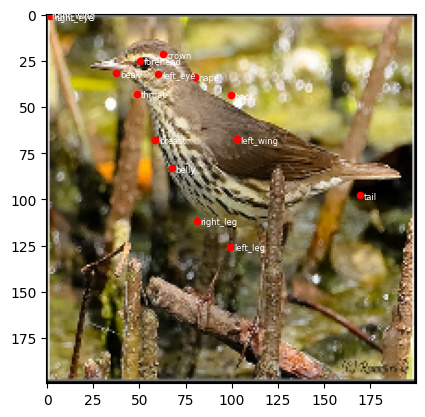

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_underparts_color::blue', 'has_breast_pattern::spotted', 'has_back_color::blue', 'has_back_color::red', 'has_upper_tail_color::blue', 'has_breast_color::blue', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_nape_color::rufous', 'has_belly_color::blue', 'has_belly_color::rufous', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_back_pattern::spotted', 'has_belly_pattern::spotted', 'has_primary_color::blue', 'has_bill_color::rufous', 'has_crown_color::blue', 'has_wing_pattern::spotted']


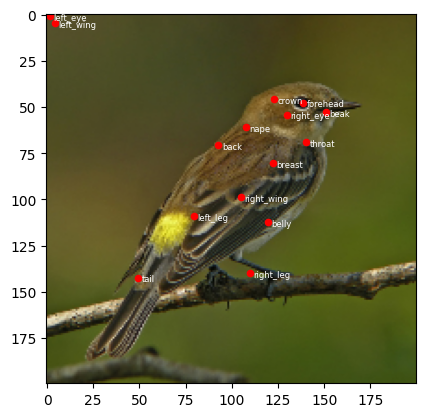

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_upperparts_color::blue', 'has_back_color::blue', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::blue', 'has_breast_color::blue', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_primary_color::blue', 'has_bill_color::orange', 'has_crown_color::blue', 'has_wing_pattern::spotted']


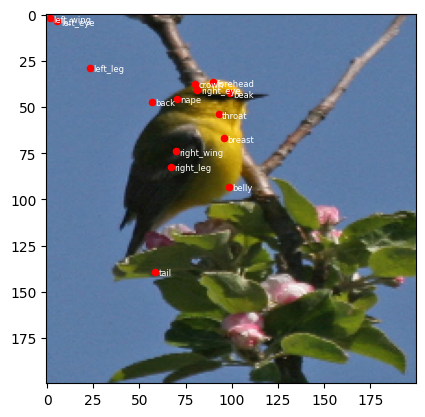

['has_bill_shape::spatulate', 'has_wing_color::rufous', 'has_wing_color::grey', 'has_wing_color::orange', 'has_upperparts_color::rufous', 'has_upperparts_color::grey', 'has_underparts_color::grey', 'has_underparts_color::buff', 'has_back_color::grey', 'has_tail_shape::rounded_tail', 'has_breast_color::grey', 'has_throat_color::grey', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::grey', 'has_under_tail_color::orange', 'has_nape_color::grey', 'has_belly_color::grey', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_back_pattern::striped', 'has_tail_pattern::striped', 'has_tail_pattern::multi-colored', 'has_primary_color::grey', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::grey', 'has_wing_pattern::striped']


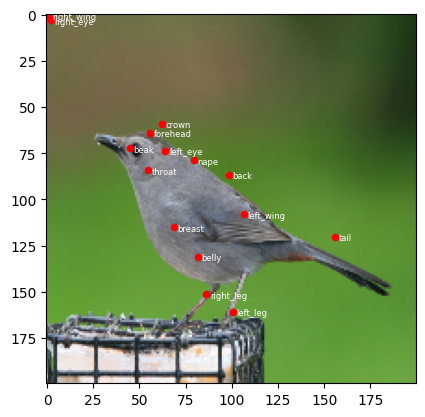

['has_bill_shape::spatulate', 'has_wing_color::rufous', 'has_upperparts_color::rufous', 'has_underparts_color::rufous', 'has_underparts_color::buff', 'has_back_color::rufous', 'has_upper_tail_color::rufous', 'has_breast_color::rufous', 'has_throat_color::rufous', 'has_eye_color::orange', 'has_eye_color::buff', 'has_bill_length::longer_than_head', 'has_forehead_color::rufous', 'has_under_tail_color::rufous', 'has_nape_color::rufous', 'has_belly_color::rufous', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_shape::perching-like', 'has_tail_pattern::multi-colored', 'has_primary_color::rufous', 'has_leg_color::rufous', 'has_bill_color::rufous', 'has_crown_color::rufous']


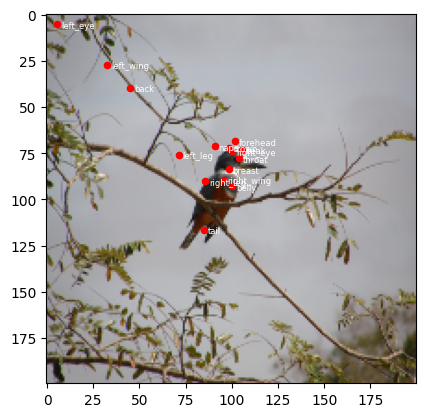

['has_wing_color::orange', 'has_upperparts_color::orange', 'has_underparts_color::orange', 'has_underparts_color::black', 'has_back_color::orange', 'has_upper_tail_color::orange', 'has_breast_color::orange', 'has_throat_color::orange', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_belly_color::orange', 'has_belly_color::black', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange']


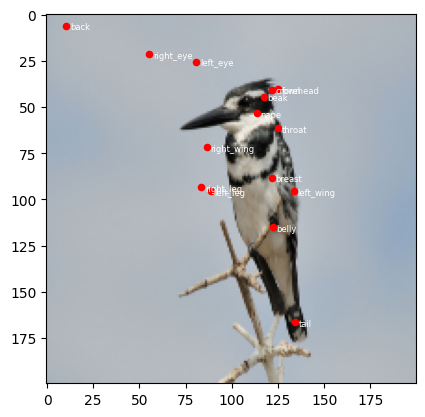

['has_bill_shape::curved_(up_or_down)', 'has_wing_color::orange', 'has_wing_color::black', 'has_upperparts_color::orange', 'has_upperparts_color::black', 'has_underparts_color::black', 'has_breast_pattern::striped', 'has_back_color::orange', 'has_back_color::black', 'has_upper_tail_color::orange', 'has_breast_color::orange', 'has_breast_color::black', 'has_throat_color::orange', 'has_throat_color::black', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_under_tail_color::black', 'has_nape_color::orange', 'has_nape_color::black', 'has_belly_color::black', 'has_size::large_(16_-_32_in)', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_primary_color::black', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange']


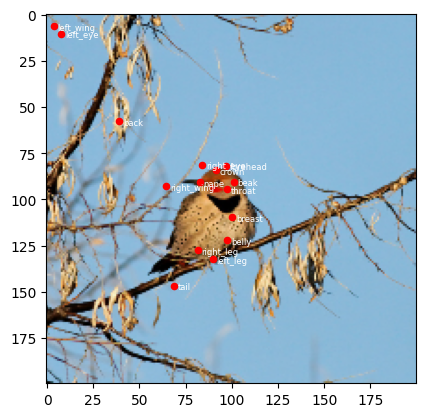

['has_wing_color::red', 'has_underparts_color::red', 'has_back_color::red', 'has_breast_color::red', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_belly_color::red', 'has_size::large_(16_-_32_in)', 'has_primary_color::red']


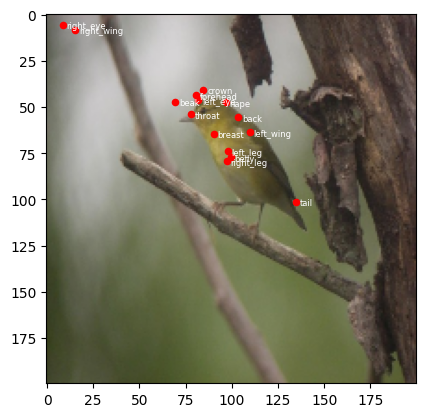

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_upperparts_color::blue', 'has_underparts_color::grey', 'has_underparts_color::buff', 'has_back_color::blue', 'has_upper_tail_color::blue', 'has_breast_color::grey', 'has_throat_color::grey', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_nape_color::blue', 'has_belly_color::grey', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::blue', 'has_primary_color::grey', 'has_crown_color::blue', 'has_crown_color::buff']


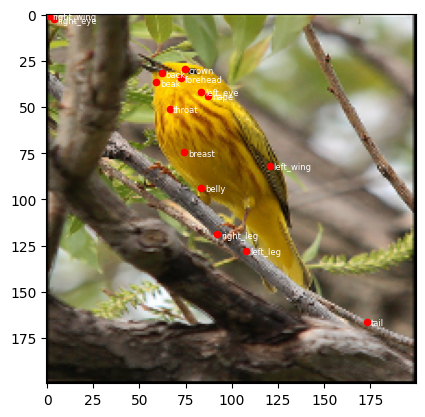

['has_bill_shape::spatulate', 'has_wing_color::grey', 'has_upperparts_color::grey', 'has_underparts_color::grey', 'has_underparts_color::buff', 'has_back_color::grey', 'has_breast_color::grey', 'has_throat_color::grey', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::grey', 'has_under_tail_color::grey', 'has_nape_color::grey', 'has_belly_color::grey', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::grey', 'has_crown_color::grey']


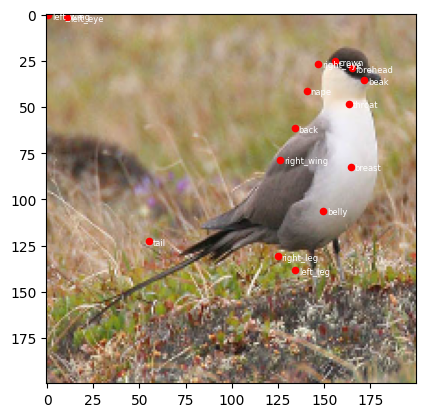

['has_wing_color::rufous', 'has_wing_color::orange', 'has_upperparts_color::rufous', 'has_upperparts_color::orange', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::rufous', 'has_back_color::orange', 'has_upper_tail_color::rufous', 'has_upper_tail_color::orange', 'has_breast_color::black', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_belly_color::black', 'has_size::large_(16_-_32_in)', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::rufous', 'has_primary_color::orange', 'has_primary_color::black', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange', 'has_crown_color::buff']


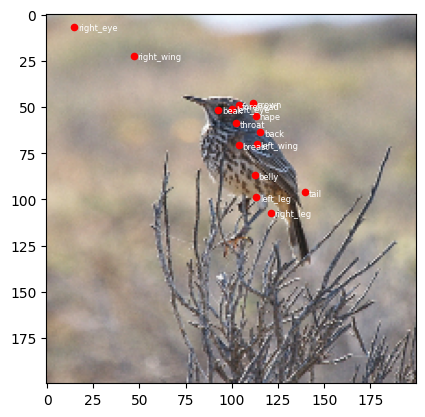

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_upperparts_color::blue', 'has_underparts_color::blue', 'has_breast_pattern::spotted', 'has_back_color::blue', 'has_upper_tail_color::blue', 'has_breast_color::blue', 'has_throat_color::blue', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_belly_color::blue', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_back_pattern::spotted', 'has_belly_pattern::spotted', 'has_primary_color::blue', 'has_bill_color::orange', 'has_crown_color::blue', 'has_wing_pattern::spotted']


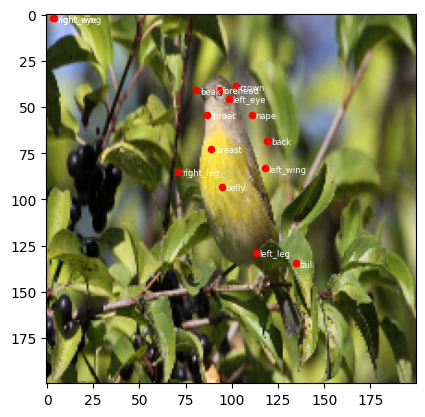

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_upperparts_color::blue', 'has_underparts_color::grey', 'has_underparts_color::buff', 'has_back_color::blue', 'has_upper_tail_color::blue', 'has_breast_color::grey', 'has_throat_color::grey', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_belly_color::grey', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_shape::perching-like', 'has_tail_pattern::multi-colored', 'has_primary_color::blue', 'has_primary_color::grey', 'has_crown_color::blue']


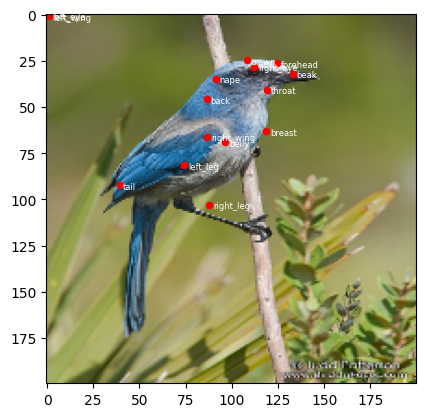

['has_bill_shape::specialized', 'has_wing_color::buff', 'has_breast_pattern::multi-colored', 'has_tail_shape::squared_tail', 'has_throat_color::black', 'has_eye_color::orange', 'has_eye_color::buff', 'has_bill_length::shorter_than_head', 'has_forehead_color::buff', 'has_under_tail_color::buff', 'has_size::large_(16_-_32_in)', 'has_belly_pattern::multi-colored', 'has_bill_color::rufous', 'has_bill_color::orange', 'has_bill_color::buff']


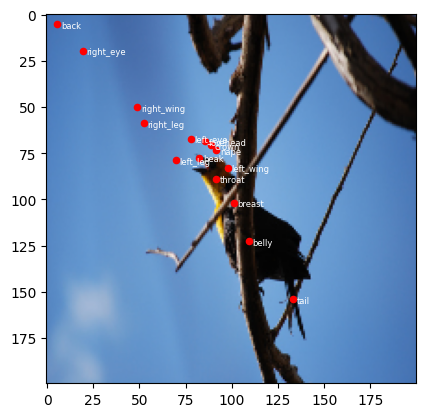

['has_wing_color::blue', 'has_wing_color::orange', 'has_upperparts_color::blue', 'has_upperparts_color::orange', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::blue', 'has_upper_tail_color::blue', 'has_upper_tail_color::orange', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::blue', 'has_under_tail_color::orange', 'has_nape_color::blue', 'has_belly_color::black', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::blue', 'has_primary_color::orange', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::blue', 'has_crown_color::buff']


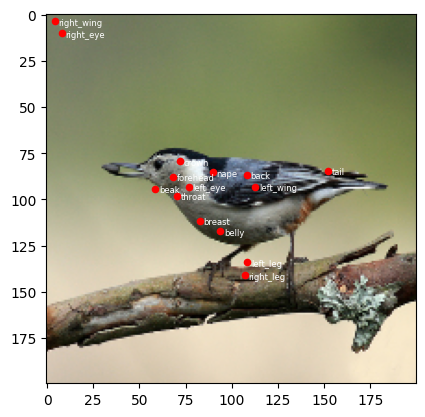

['has_bill_shape::spatulate', 'has_wing_color::orange', 'has_wing_color::black', 'has_upperparts_color::orange', 'has_upperparts_color::black', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::orange', 'has_upper_tail_color::orange', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_belly_color::black', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::striped', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_primary_color::black', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange', 'has_wing_pattern::striped']


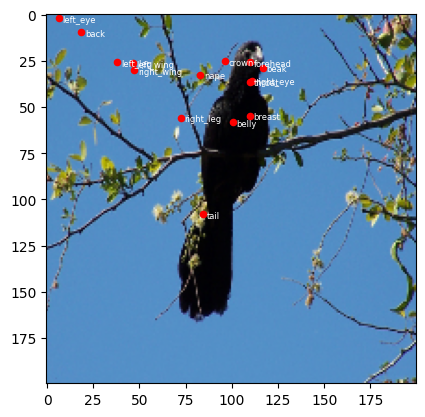

['has_wing_color::orange', 'has_upperparts_color::orange', 'has_underparts_color::orange', 'has_underparts_color::buff', 'has_back_color::orange', 'has_upper_tail_color::orange', 'has_head_pattern::eyering', 'has_breast_color::orange', 'has_throat_color::orange', 'has_eye_color::orange', 'has_eye_color::buff', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_belly_color::orange', 'has_size::very_large_(32_-_72_in)', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::buff']


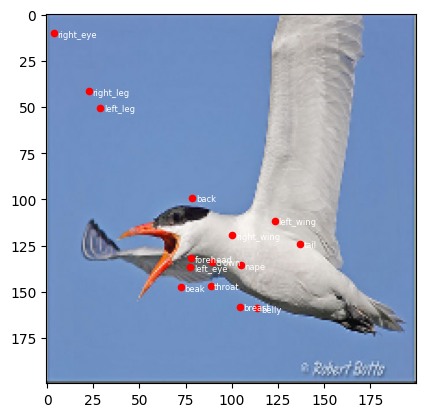

['has_bill_shape::curved_(up_or_down)', 'has_wing_color::black', 'has_upperparts_color::black', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::black', 'has_upper_tail_color::black', 'has_head_pattern::striped', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::orange', 'has_under_tail_color::black', 'has_nape_color::black', 'has_belly_color::black', 'has_size::very_large_(32_-_72_in)', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::black', 'has_crown_color::orange', 'has_crown_color::buff']


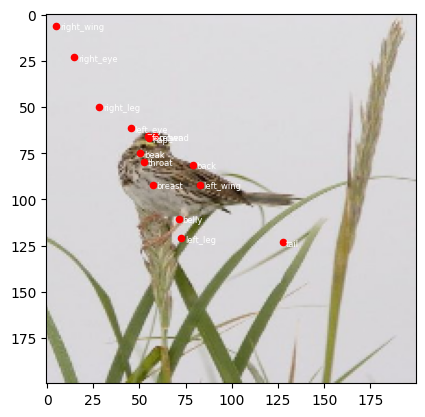

['has_bill_shape::all-purpose', 'has_wing_color::blue', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_upperparts_color::red', 'has_underparts_color::black', 'has_breast_pattern::spotted', 'has_back_color::blue', 'has_back_color::red', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::blue', 'has_upper_tail_color::red', 'has_head_pattern::eyeline', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_under_tail_color::red', 'has_nape_color::blue', 'has_nape_color::red', 'has_belly_color::black', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_back_pattern::spotted', 'has_primary_color::blue', 'has_primary_color::black', 'has_leg_color::red', 'has_bill_color::red', 'has_crown_color::blue', 'has_wing_pattern::spotted']


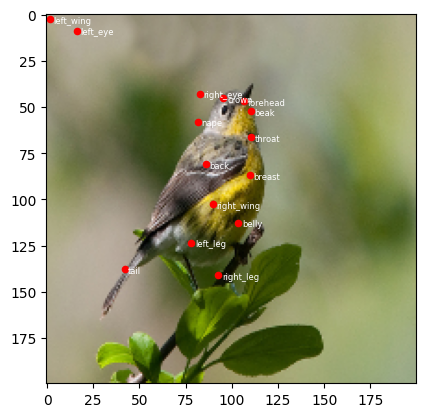

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_wing_color::rufous', 'has_upperparts_color::blue', 'has_upperparts_color::rufous', 'has_underparts_color::grey', 'has_back_color::blue', 'has_back_color::rufous', 'has_back_color::red', 'has_tail_shape::rounded_tail', 'has_breast_color::grey', 'has_throat_color::grey', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::rufous', 'has_nape_color::rufous', 'has_belly_color::grey', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::rufous', 'has_primary_color::grey', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::rufous', 'has_wing_pattern::spotted']


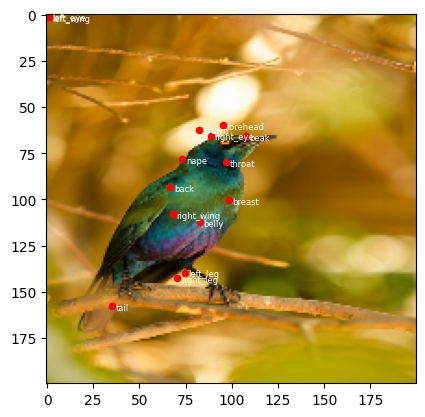

['has_bill_shape::specialized', 'has_wing_color::buff', 'has_upperparts_color::buff', 'has_breast_pattern::multi-colored', 'has_tail_shape::squared_tail', 'has_breast_color::buff', 'has_eye_color::orange', 'has_bill_length::shorter_than_head', 'has_forehead_color::buff', 'has_under_tail_color::buff', 'has_size::large_(16_-_32_in)', 'has_belly_pattern::multi-colored', 'has_bill_color::buff']


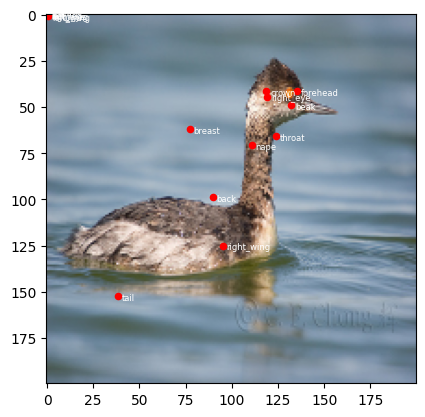

['has_bill_shape::hooked_seabird', 'has_wing_color::blue', 'has_wing_color::rufous', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_upperparts_color::rufous', 'has_upperparts_color::red', 'has_back_color::rufous', 'has_back_color::red', 'has_upper_tail_color::rufous', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::rufous', 'has_belly_color::rufous', 'has_size::very_large_(32_-_72_in)', 'has_shape::long-legged-like', 'has_primary_color::rufous', 'has_primary_color::red', 'has_bill_color::rufous', 'has_crown_color::rufous']


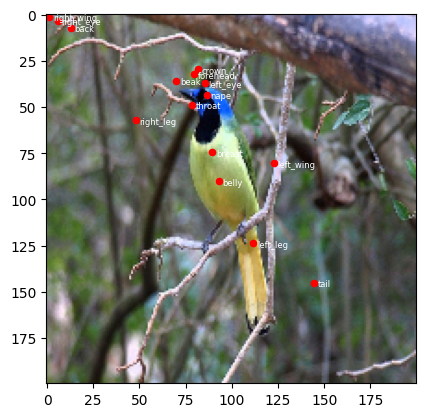

['has_bill_shape::spatulate', 'has_underparts_color::grey', 'has_underparts_color::buff', 'has_eye_color::orange', 'has_eye_color::buff', 'has_size::large_(16_-_32_in)', 'has_tail_pattern::multi-colored', 'has_leg_color::rufous', 'has_bill_color::orange']


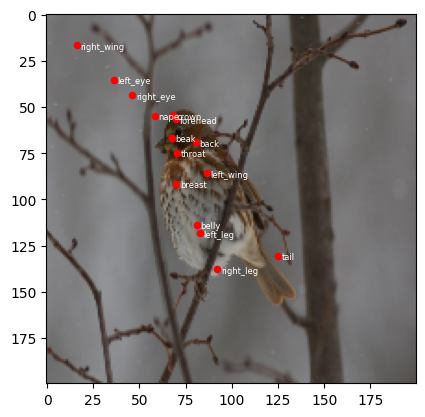

['has_bill_shape::all-purpose', 'has_wing_color::blue', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_upperparts_color::red', 'has_underparts_color::blue', 'has_underparts_color::black', 'has_breast_pattern::spotted', 'has_back_color::blue', 'has_back_color::red', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::blue', 'has_upper_tail_color::red', 'has_breast_color::blue', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_under_tail_color::red', 'has_nape_color::blue', 'has_nape_color::red', 'has_belly_color::black', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_back_pattern::spotted', 'has_belly_pattern::spotted', 'has_primary_color::blue', 'has_primary_color::black', 'has_leg_color::red', 'has_bill_color::red', 'has_crown_color::blue', 'has_wing_pattern::spotted']


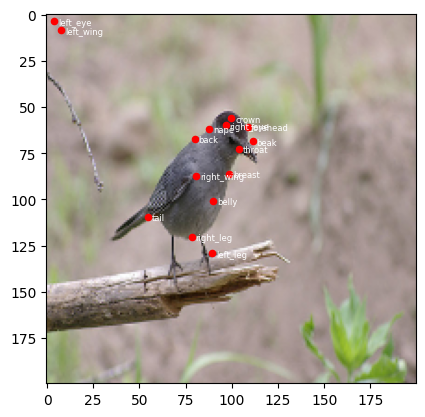

['has_wing_color::rufous', 'has_upperparts_color::rufous', 'has_underparts_color::rufous', 'has_underparts_color::buff', 'has_back_color::rufous', 'has_upper_tail_color::rufous', 'has_breast_color::rufous', 'has_throat_color::rufous', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::rufous', 'has_under_tail_color::rufous', 'has_nape_color::rufous', 'has_belly_color::rufous', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::rufous', 'has_leg_color::orange', 'has_bill_color::rufous', 'has_bill_color::orange', 'has_crown_color::rufous']


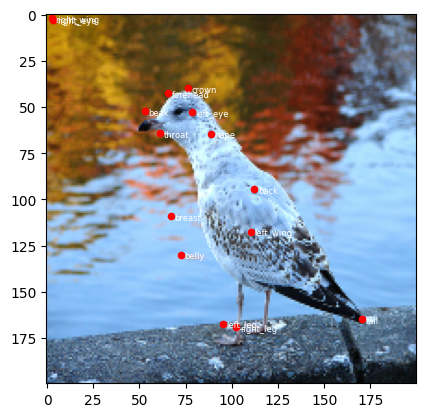

['has_wing_color::rufous', 'has_wing_color::orange', 'has_wing_color::black', 'has_upperparts_color::rufous', 'has_upperparts_color::orange', 'has_upperparts_color::black', 'has_underparts_color::black', 'has_back_color::rufous', 'has_back_color::black', 'has_upper_tail_color::black', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::black', 'has_under_tail_color::black', 'has_nape_color::black', 'has_belly_color::black', 'has_size::very_large_(32_-_72_in)', 'has_tail_pattern::multi-colored', 'has_primary_color::rufous', 'has_primary_color::black', 'has_crown_color::black']


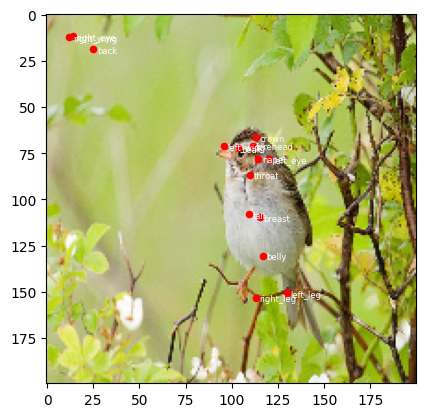

['has_bill_shape::all-purpose', 'has_wing_color::blue', 'has_wing_color::rufous', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_upperparts_color::rufous', 'has_underparts_color::rufous', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::blue', 'has_back_color::red', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::blue', 'has_breast_color::rufous', 'has_breast_color::black', 'has_throat_color::rufous', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::rufous', 'has_under_tail_color::red', 'has_nape_color::rufous', 'has_belly_color::rufous', 'has_belly_color::black', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::rufous', 'has_bill_color::red', 'has_crown_color::rufous', 'has_wing_pattern::spotted']


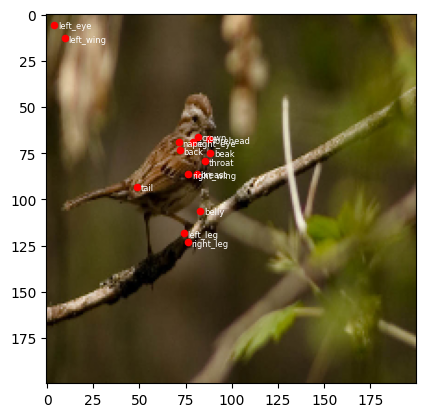

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_upperparts_color::blue', 'has_underparts_color::blue', 'has_underparts_color::red', 'has_breast_pattern::spotted', 'has_back_color::blue', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::blue', 'has_breast_color::blue', 'has_breast_color::red', 'has_throat_color::blue', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_belly_color::blue', 'has_belly_color::red', 'has_belly_color::buff', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_primary_color::blue', 'has_crown_color::blue', 'has_wing_pattern::spotted']


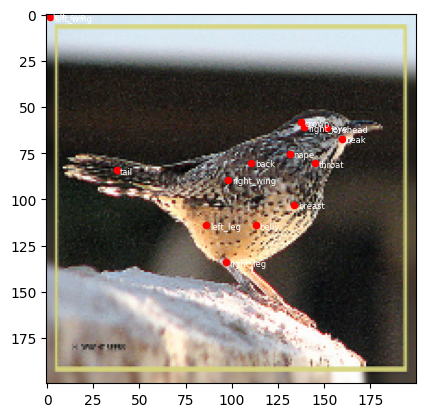

['has_bill_shape::spatulate', 'has_wing_color::blue', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_underparts_color::blue', 'has_underparts_color::red', 'has_back_color::blue', 'has_back_color::red', 'has_upper_tail_color::blue', 'has_breast_color::blue', 'has_breast_color::red', 'has_throat_color::red', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_belly_color::blue', 'has_belly_color::red', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_primary_color::blue', 'has_primary_color::red', 'has_bill_color::orange', 'has_crown_color::blue']


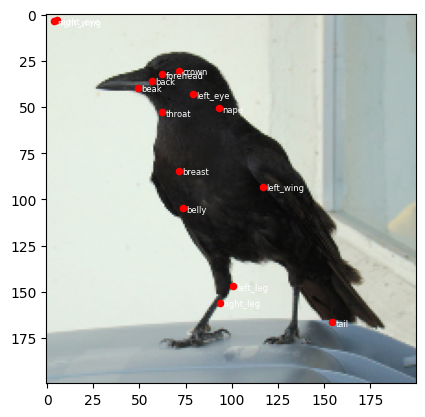

['has_wing_color::orange', 'has_upperparts_color::orange', 'has_underparts_color::orange', 'has_underparts_color::buff', 'has_back_color::orange', 'has_upper_tail_color::orange', 'has_head_pattern::eyering', 'has_breast_color::orange', 'has_throat_color::orange', 'has_eye_color::orange', 'has_eye_color::buff', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_belly_color::orange', 'has_belly_color::buff', 'has_size::very_large_(32_-_72_in)', 'has_shape::perching-like', 'has_back_pattern::multi-colored', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange', 'has_crown_color::buff']


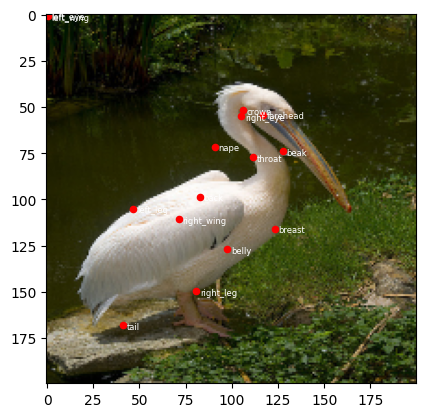

['has_wing_color::black', 'has_upperparts_color::black', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::black', 'has_upper_tail_color::black', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_eye_color::buff', 'has_bill_length::about_the_same_as_head', 'has_forehead_color::black', 'has_under_tail_color::black', 'has_nape_color::black', 'has_belly_color::black', 'has_tail_pattern::multi-colored', 'has_primary_color::black', 'has_crown_color::black']


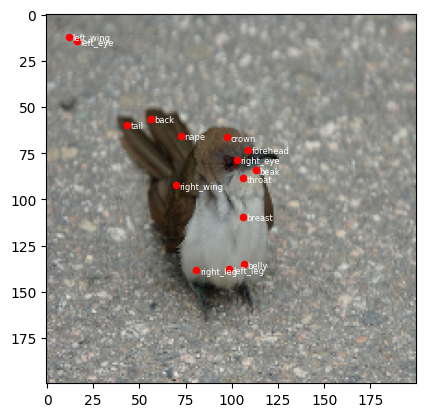

['has_wing_color::blue', 'has_wing_color::red', 'has_upperparts_color::blue', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::blue', 'has_back_color::red', 'has_upper_tail_color::blue', 'has_breast_color::black', 'has_throat_color::black', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::blue', 'has_under_tail_color::blue', 'has_nape_color::blue', 'has_belly_color::black', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::blue', 'has_crown_color::blue']


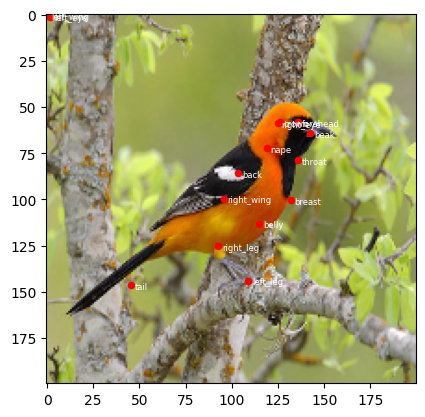

['has_wing_color::orange', 'has_upperparts_color::orange', 'has_underparts_color::buff', 'has_back_color::orange', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::orange', 'has_throat_color::orange', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange', 'has_wing_pattern::striped']


In [282]:
for i in range(32) : 
    L = []
    im = data[i].numpy()
    
    plt.imshow(np.transpose(im, (1, 2, 0)))
    p = parts_out[i].numpy()
    # plt.scatter(r[:15]*200, r[15:]*200, c='b', s=20)
    plt.scatter(p[:15]*200, p[15:]*200, c='r', s=20)

    for k in range(15) : 
        plt.text(p[k]*200+2, p[k+15]*200+2, parts_names[k+1], fontsize=6, c='w')
    plt.show()
    ext_attributes = np.where(z1[i].numpy()>0.5)[0]
    for idx in ext_attributes : 
        L.append(attributes_names[idx])
    print(L)

In [283]:
SAE.eval()
sem_embedding = []
res_embedding = []
img_classes = []
features = []
reconst_features = []

with torch.no_grad():
    for data, labels, classes, seg_data, _ in train_data_loader_sem:
        feature_map, z1, z2, reconst_map, _ = SAE(data)
        sem_embedding += list(z1.numpy())
        res_embedding += list(z2.numpy())
        img_classes += list(classes.numpy())
        features += list(feature_map.numpy())
        reconst_features += list(reconst_map.numpy())
        
        
sem_embedding = np.array(sem_embedding)
res_embedding = np.array(res_embedding)
img_classes = np.array(img_classes)
features = np.array(features)
reconst_features = np.array(reconst_features)

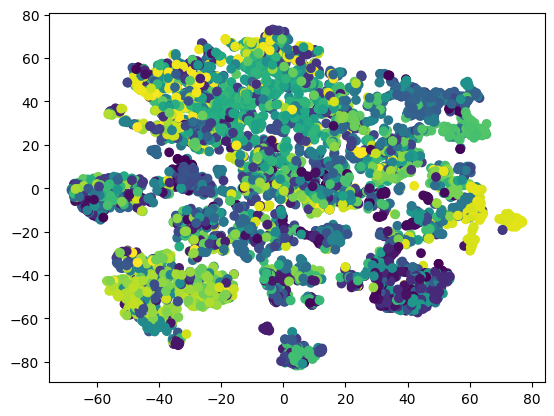

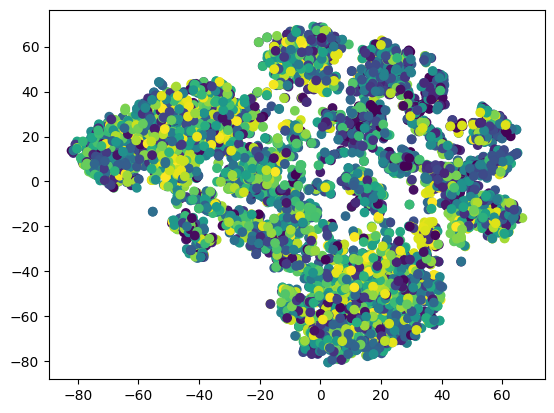

In [284]:
from sklearn.manifold import TSNE 

tsne = TSNE(n_components=2)
X_sem = tsne.fit_transform(sem_embedding)
X_res = tsne.fit_transform(res_embedding)

plt.scatter(X_sem[:, 0], X_sem[:, 1], c=img_classes)
plt.show()
plt.scatter(X_res[:, 0], X_res[:, 1], c=img_classes)
plt.show()

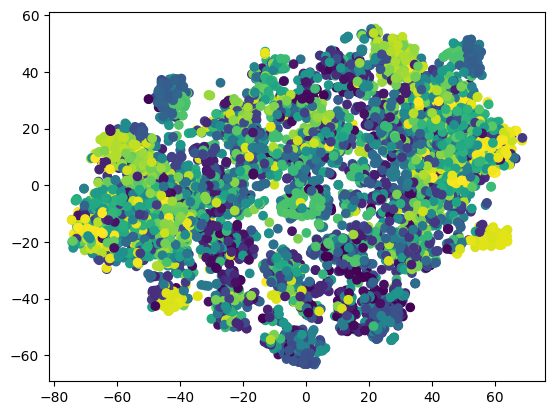

In [285]:
tsne = TSNE(n_components=2)
X_feat = tsne.fit_transform(features)

plt.scatter(X_feat[:, 0], X_feat[:, 1], c=img_classes)
plt.show()

In [286]:
for i in range(len(history['mse'])) : 
    history['mse'][i] = history['mse'][i].detach().numpy()

In [287]:
for i in range(len(history['bce'])) : 
    history['bce'][i] = history['bce'][i].detach().numpy()

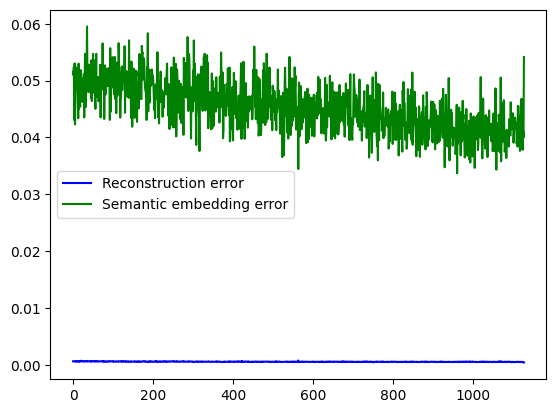

In [288]:
plt.plot(history['mse'], label='Reconstruction error', c='b')
plt.plot(history['bce'], label='Semantic embedding error', c='g')
plt.legend()
plt.show()

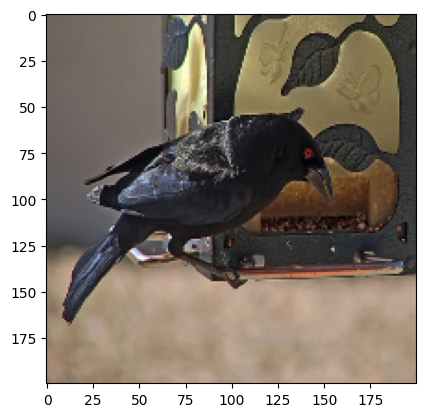

['has_wing_color::orange', 'has_upperparts_color::orange', 'has_underparts_color::buff', 'has_back_color::orange', 'has_tail_shape::rounded_tail', 'has_upper_tail_color::orange', 'has_throat_color::orange', 'has_eye_color::orange', 'has_bill_length::longer_than_head', 'has_forehead_color::orange', 'has_under_tail_color::orange', 'has_nape_color::orange', 'has_size::large_(16_-_32_in)', 'has_shape::swallow-like', 'has_tail_pattern::multi-colored', 'has_primary_color::orange', 'has_leg_color::orange', 'has_bill_color::orange', 'has_crown_color::orange', 'has_wing_pattern::striped', 'has_bill_shape::all-purpose', 'has_wing_color::blue', 'has_wing_color::orange', 'has_upperparts_color::blue', 'has_upperparts_color::orange', 'has_underparts_color::black', 'has_underparts_color::buff', 'has_back_color::blue', 'has_back_color::orange', 'has_tail_shape::forked_tail', 'has_upper_tail_color::blue', 'has_head_pattern::eyebrow', 'has_breast_color::black', 'has_throat_color::rufous', 'has_eye_color

In [295]:
with torch.no_grad():
    for data, labels, classes, seg_data, _ in train_data_loader_sem:
        plt.imshow(np.transpose(data[0].numpy(), (1, 2, 0)))
        plt.show()
        ext_attributes = np.where(labels[0].numpy()>0.5)[0]
        for idx in ext_attributes : 
            L.append(attributes_names[idx])
        print(L)
        break

In [289]:
# torch.save(resnet.state_dict(), '../models/finetuned_resnet.pth')

In [28]:
# model = models.resnet50() # we do not specify ``weights``, i.e. create untrained model
# num_ftrs = model.fc.in_features

# model.fc = nn.Sequential(
#     nn.Linear(num_ftrs, 500),
#     nn.ReLU(), 
#     nn.Linear(500, 30),
#     nn.Sigmoid()  # Apply sigmoid activation
# )
# model.load_state_dict(torch.load('../models/finetuned_resnet.pth'))
# model.fc.parameters()
import torchvision.models as models
import torch.optim as optim
from efficientnet_pytorch import EfficientNet

In [66]:
model_sem = models.resnet50() # we do not specify ``weights``, i.e. create untrained model
num_ftrs = model_sem.fc.in_features

model_sem.fc = nn.Sequential(
    nn.Linear(num_ftrs, 500),
    nn.ReLU(), 
    nn.Linear(500, 30),
    nn.Sigmoid()  # Apply sigmoid activation
)
model_sem.load_state_dict(torch.load('../models/finetuned_resnet.pth'))
model_sem.fc.parameters()

criterion = nn.MSELoss()
optimizer = optim.Adam(model_sem.parameters(), lr=0.001)

In [67]:
# train(model_sem, train_data_loader, criterion, optimizer, num_epochs=1)

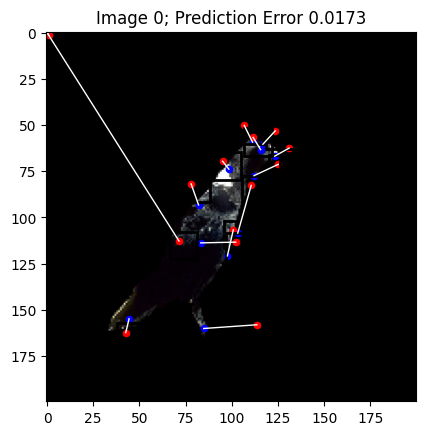

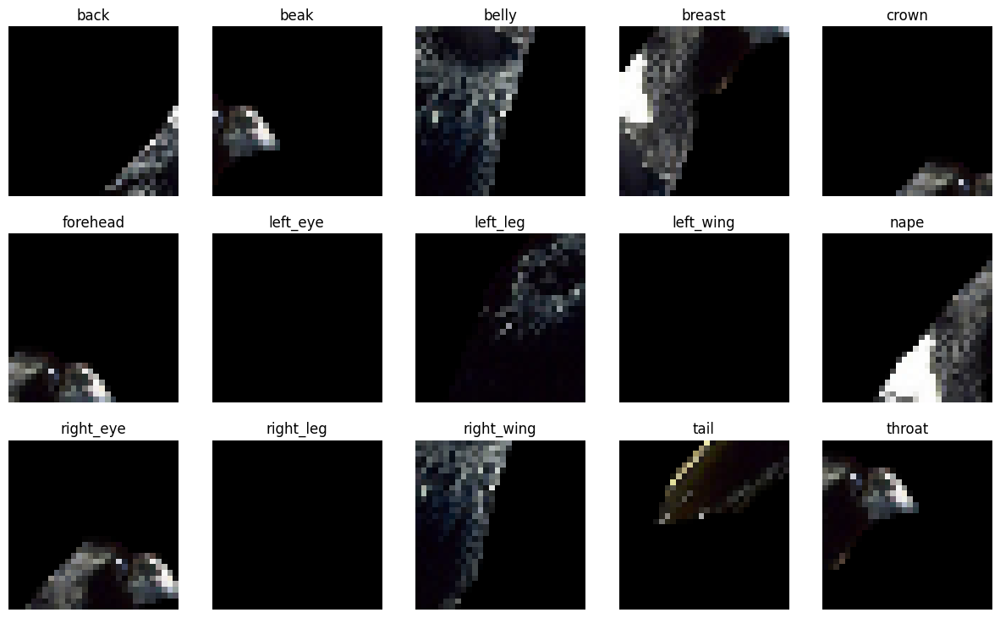

In [131]:

with torch.no_grad():
    for (data, parts_lab, class_labs, seg) in train_data_loader :
        
        out = model_sem(data)
        i = 0
        r, p = parts_lab.numpy()[i], out.numpy()[i]

        im = np.transpose(seg.numpy()[i], (1, 2, 0))
        plt.imshow(im)

        plt.scatter(r[:15]*200, r[15:]*200, c='b', s=20)
        plt.scatter(p[:15]*200, p[15:]*200, c='r', s=20)
        
        error = np.sum((r-p)**2)/30

        segments = []
        for k in range(15) : 
            if p[k]>0.1 and p[k+15]>0.1 : 
                bbox = patches.Rectangle((p[k]*200-5, p[k+15]*200-5), 15, 15, linewidth=2, edgecolor='black', facecolor='none')
                plt.gca().add_patch(bbox)
                segments.append(im[int(p[k+15]*200)-15: int(p[k+15]*200)+15, int(p[k]*200)-15: int(p[k]*200)+15])
            else : 
                segments.append(np.zeros((30, 30, 3)))
            plt.plot([r[k]*200, p[k]*200], [r[k+15]*200, p[k+15]*200], c='w', linewidth=1)
            
        plt.title(f'Image {str(i)}; Prediction Error {round(error, 4)}')

        plt.show()
    
        fig, axes = plt.subplots(3, 5, figsize=(15, 9))
        axes = axes.flatten()
        for i, image in enumerate(segments):
            axes[i].imshow(segments[i])
            axes[i].axis('off')
            axes[i].set_title(parts_names[i+1])
        # for i in range(len(images), len(axes)):
        #     axes[i].axis('off')

        plt.show()
        break
        
    

In [114]:
hist_data = [] 
class_data = []

with torch.no_grad():
    for (data, parts_lab, class_labs, seg_data) in test_data_loader :
        
        out = model_sem(data)
        
        
        for i in range(len(data.numpy())) : 
            
            r, p = parts_lab.numpy()[i], out.numpy()[i]

            im = np.transpose(seg_data.numpy()[i], (1, 2, 0))

            hist = []
            for k in range(15) : 
                if p[k]>0.1 and p[k+15]>0.1 : 
                    seg = im[int(p[k+15]*200)-20: int(p[k+15]*200)+20, int(p[k]*200)-20: int(p[k]*200)+20]    
                else : 
                    seg = np.zeros((30, 30, 3))
                
                for c in range(3) : 
                    hist += list(np.histogram(seg[:, :, c], bins=6)[0])
                
            hist_data.append(hist)
        class_data += list(class_labs.numpy())
        
        
class_data =  np.array(class_data)
hist_data = np.array(hist_data)
    

In [119]:
len(np.unique(train_ds[2]))

200

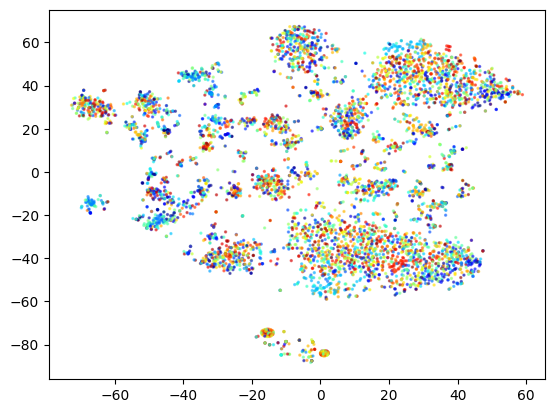

In [128]:
from sklearn.manifold import TSNE 

tsne = TSNE(n_components=2)
X_sem = tsne.fit_transform(hist_data[:len(class_data)])

plt.scatter(X_sem[:, 0], X_sem[:, 1], c=class_data, s=2, alpha=0.5, cmap='jet')
plt.show()

In [124]:
np.array(train_ds[2])

array([  1,   1,   1, ..., 200, 200, 200])

In [ ]:

tsne = TSNE(n_components=2)
X_sem = tsne.fit_transform(np.array(train_ds[1]))


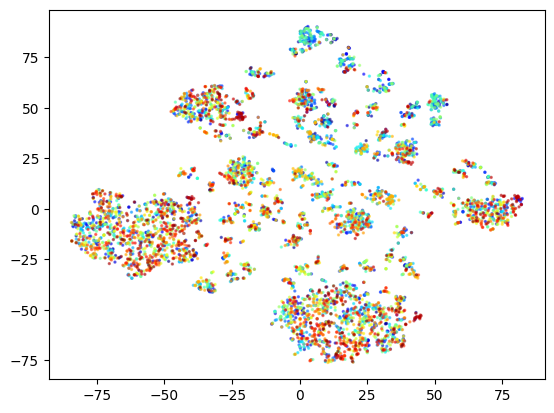

In [127]:
plt.scatter(X_sem[:, 0], X_sem[:, 1], c=np.array(train_ds[2]), s=2, alpha=0.5, cmap='jet')
plt.show()